In [9]:
!which python
!python --version

/home/green/ENV3/bin/python
Python 3.10.8


In [10]:
!pip install h5py
!pip install matplotlib
!pip install numpy
!pip install pandas
!pip install astral
!pip install plotly
!pip install eumdac
!pip install requests
!pip install folium
!pip install cloudmesh-common
!pip install selenium
!pip install tqdm
!pip install geopandas
!pip install cartopy

In [11]:
import h5py
import numpy as np
import os
import matplotlib.dates as mdates
import matplotlib.image as img
import matplotlib.pyplot as plt
from datetime import timedelta
import pandas as pd
from datetime import datetime
from astral.sun import sun
from astral import LocationInfo
import plotly.express as px

import eumdac
from IPython.core.display import HTML
import requests
import shutil
import time
from cloudmesh.common.util import readfile
from cloudmesh.common.util import path_expand
from cloudmesh.common.util import banner

import folium
import time
from selenium import webdriver
from tqdm import tqdm
import geopandas as gpd
from cloudmesh.common.systeminfo import os_is_windows
from cloudmesh.common.systeminfo import os_is_mac
from cloudmesh.common.systeminfo import os_is_linux
from cloudmesh.common.console import Console
from cloudmesh.common.Shell import Shell
from cloudmesh.common.util import writefile

In [12]:
import os

# adjust this accordingly
if os_is_mac():
    target = "gregor-mac"
elif os_is_linux():
    target = "gregor-linux"
else:
    Console.error("specify a target and define it")

if target == "os":
    BASE=os.environ["BASE"]
    DATA_DIR=os.environ["DATA_DIR"]
    PROJECT_SRC=os.environ["PROJECT_SRC"]
    PROJECT=os.environ["PROJECT"]
    ESAT=os.environ["ESAT"]
    EDITOR=os.environ["EDITOR"]
elif target == "rivanna":
    USER = os.environ["USER"]
    BASE=f"/scratch/{USER}"
    DATA_DIR="/nfs/flash/mlcommons/data"
    PROJECT_SRC=f"{BASE}/mlcommons/src"
    PROJECT=f"{PROJECT_SRC}/mlcommons"
    ESAT="~/.esat"
    EDITOR="emacs"
elif target == "ruoshen":
    BASE="C:/Users/bill_/scratch"
    DATA_DIR=f"{BASE}/mlcommons/data"
    PROJECT_SRC=f"{BASE}/mlcommons/src"
    PROJECT=f"{PROJECT_SRC}/mlcommons"
    ESAT="C:/Users/bill_/esat"
    EDITOR="???"
elif target == "gregor-linux":
    BASE="/scratch"
    DATA_DIR="/nfs/flash/mlcommons/data"
    PROJECT_SRC=f"{BASE}/mlcommons/src"
    PROJECT=f"{PROJECT_SRC}/mlcommons"
    ESAT="~/.esat"
    EDITOR="emacs"
elif target == "gregor-mac":
    BASE="/scratch"
    DATA_DIR="/Volumes/flash/mlcommons/data"
    PROJECT_SRC=f"{BASE}/mlcommons/src"
    PROJECT=f"{PROJECT_SRC}/mlcommons"
    ESAT="~/.esat"
    EDITOR="open -a aquamacs"

def get_var_name(var):
    """
    Get the name of a variable as a string.
    """
    for name, value in globals().items():
        if value is var:
            return name
    return None

def print_var(v, n=15):
    name = get_var_name(v)
    print(f"{name.ljust(n)}: {v}")

banner("ENVIRONMENT")
for v in [target,BASE,DATA_DIR,PROJECT_SRC,PROJECT,ESAT]:
    print_var(v)




# ----------------------------------------------------------------------
# ENVIRONMENT
# ----------------------------------------------------------------------

target         : gregor-linux
BASE           : /scratch
DATA_DIR       : /nfs/flash/mlcommons/data
PROJECT_SRC    : /scratch/mlcommons/src
PROJECT        : /scratch/mlcommons/src/mlcommons
ESAT           : ~/.esat


# ---------------------------------------------------------------------------
# SET UP ESAT API KEY
# ---------------------------------------------------------------------------

To get the token please optein the API keys for consumer-key and secret-key by
executing the next line and copy them to the directory ~/.esat in the
appropriate files


In [13]:
Shell.mkdir("~/.esat")
for file_path in ["~/.esat/consumer-key", "~/.esat/consumer-secret"]:

    file_path = os.path.expanduser("~/.esat/consumer-key")

    # Check if the file exists
    if not os.path.exists(file_path):
        # Create an empty file if it doesn't exist
        with open(file_path, 'w') as file:
            pass
        print(f"Empty file created at: {file_path}")
    else:
        print(f"The file already exists at: {file_path}")

from cloudmesh.common.Shell import Shell
Shell.open("https://api.eumetsat.int/api-key/")

Shell.run(f"{EDITOR} ~/.esat/consumer-key")
Shell.run(f"{EDITOR} ~/.esat/consumer-secret")


The file already exists at: /home/green/.esat/consumer-key
The file already exists at: /home/green/.esat/consumer-key


2023-12-07 14:17:05.682 gopen[359589:359589] Unable to contact pasteboard server - please ensure that gpbs is running for local host.
2023-12-07 14:17:05.682 gopen[359589:359589] No service matching 'OpenURL'
Gtk-Message: 14:17:05.845: Not loading module "atk-bridge": The functionality is provided by GTK natively. Please try to not load it.
[359600, Main Thread] WARNING: GTK+ module /snap/firefox/3416/gnome-platform/usr/lib/gtk-2.0/modules/libcanberra-gtk-module.so cannot be loaded.
GTK+ 2.x symbols detected. Using GTK+ 2.x and GTK+ 3 in the same process is not supported.: 'glib warning', file /build/firefox/parts/firefox/build/toolkit/xre/nsSigHandlers.cpp:187

(firefox:359600): Gtk-WARNING **: 14:17:05.912: GTK+ module /snap/firefox/3416/gnome-platform/usr/lib/gtk-2.0/modules/libcanberra-gtk-module.so cannot be loaded.
GTK+ 2.x symbols detected. Using GTK+ 2.x and GTK+ 3 in the same process is not supported.
Gtk-Message: 14:17:05.912: Failed to load module "canberra-gtk-module"
[3596

''

In [14]:
import humanize

consumer_key = readfile(f"{ESAT}/consumer-key").strip()
consumer_secret = readfile(f"{ESAT}/consumer-secret").strip()

# print(consumer_key, consumer_secret)

credentials = (consumer_key, consumer_secret)

token = eumdac.AccessToken(credentials)

from pprint import pprint
pprint(token.expiration)

try:
    print(f"This token '{token}' expires {token.expiration}")
    now = datetime.now()
    duration = token.expiration - now
    print(f"This is in {humanize.naturaltime(duration)}")
except requests.exceptions.HTTPError as exc:
    print(f"Error when tryng the request to the server: '{exc}'")

datetime.datetime(1969, 12, 31, 19, 0)
This token '95bf8fb9-da73-33a9-b474-c48e162fa0b6' expires 2023-12-07 15:17:11.716259
This is in 59 minutes ago


In [15]:
def save_plot(plt, file_name, dpi=300):
    plt.savefig(f"{file_name}.pdf", format='pdf', bbox_inches='tight')
    plt.savefig(f"{file_name}.png", format='png', dpi=dpi)

In [16]:
# Suggestion: rename the class to SLSTRFileAnalyzer
class SLSTRFileNameParser:
    def __init__(self, file_name):
        self.file_name = file_name
        self.file_info = self.parse_file_name()

    def parse_file_name(self):
        components = [obj for obj in self.file_name.split('_') if obj!='']

        try:
            hdf = h5py.File(f"{DATA_DIR}/ssts/day/"+self.file_name, 'r')
            day = True
        except:
            hdf = h5py.File(f"{DATA_DIR}/ssts/night/"+self.file_name, 'r')
            day = False

        return {
            "filename": self.file_name,
            "mission_id": components[0],
            "data_source": components[1],
            "processing_level": components[2],
            "data_type_id": components[3],
            "start_time": datetime.strptime(components[4], "%Y%m%dT%H%M%S"),
            "stop_time": datetime.strptime(components[5], "%Y%m%dT%H%M%S"),
            "creation_date": datetime.strptime(components[6], "%Y%m%dT%H%M%S"),
            "instance_id": components[7]+'_'+components[8]+'_'+components[9]+'_'+components[10],
            "center_id": components[11],
            "class_id": components[12]+'_'+components[13]+'_'+components[14].split('.')[0],
            "file_extension": components[14].split('.')[1],
            "hdf_file": hdf,
            "daylight": "day" if day else "night"
        }

    def get_file_info(self):
        return self.file_info

    def hdf_info(self):
        file = self.hdf_file
        print(file.keys())
        for key in file.keys():
            dset = file[key]
            print(key, "-->", dset.dtype, dset.shape)

    @staticmethod
    def generate_dataframe(file_names):
        data = []
        for counter, file_name in enumerate(file_names, start=1):
            parser = SLSTRFileNameParser(file_name)
            file_info = parser.get_file_info()
            file_info['counter'] = counter
            data.append(file_info)

        df = pd.DataFrame(data) 
        df['dt_m'] = (df['stop_time'] - df['start_time']).dt.total_seconds() / 60
        df = df[['counter', 'daylight', 'start_time', 'stop_time', 'dt_m'] + [col for col in df.columns if col not in ['counter', 'daylight', 'start_time', 'stop_time', 'dt_m']]]

        return df
        
    # not used
    @staticmethod
    def plot_gantt_chart(dataframe):
        # Sort DataFrame by start time for correct Gantt chart representation
        df = dataframe.sort_values(by=['start_time'])

        # Create Gantt chart
        fig = px.timeline(df, 
                          x_start='start_time', 
                          x_end='stop_time', 
                          y='counter', 
                          color='processing_level',
                          labels={'counter':'counter', 
                                  'mission_id': 'Mission ID', 
                                  'start_time': 'Start Time', 
                                  'stop_time': 'Stop Time'},
                          title='SLSTR Products Gantt Chart',
                          )

        # Add counter as the first element in the labels
        fig.update_layout(xaxis_title='Time', 
                          yaxis_title='Counter', 
                          showlegend=False)
        fig.update_traces(text=df.apply(lambda row: f"{row['counter']} - {row.name}", axis=1), hoverinfo='text+y')

        # Show the chart
        fig.show()

    @staticmethod
    def plot_scatterplot(dataframe):
        # Sort DataFrame by start time for correct Gantt chart representation
        df = dataframe.sort_values(by=['start_time'])
    
        plt.figure(figsize=(16*5, 9*5))
        
        df.plot(kind='scatter', x='start_time', y='counter', label='Start Time', c='green', s=10)
        df.plot(kind='scatter', x='stop_time', y='counter', label='Stop Time', c='red', s=10, ax=plt.gca())
    
        plt.title('SLSTR Products Scatter Plot')
        plt.xlabel('Date & Time')
        plt.ylabel('Counter')
        plt.legend()
    
        # dtime = pd.date_range(start = '2019-10-01', end = '2019-10-31', freq = '10min')
        dtime = pd.date_range(start = df.iloc[0]['start_time'].strftime('%Y-%m-%d'), end = df.iloc[-1]['stop_time'].strftime('%Y-%m-%d'), freq = '10min')
    
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval = 3))
        plt.gca().xaxis.set_minor_locator(mdates.DayLocator(interval = 1))
        plt.setp(plt.gca().xaxis.get_majorticklabels(), rotation = 45 )
        plt.gca().set_xlim(dtime[0], dtime[-1])
    
        plt.show()

    @staticmethod
    def plot_image_matrix(dataframe, sort_by_time=False, display_time_in_title=False, size=15, fontsize=15, x_offset=0, y_offset=0, dx=100, counter_in_title=True):
        if sort_by_time:
            dataframe = dataframe.sort_values(by=['start_time'])
        
        fig, axs = plt.subplots(10, 10, figsize=(size, size))
        for i in range(100):
            dset = dataframe.iloc[i]['hdf_file']['bayes']
            data = np.asarray(dset)
            row,col = divmod(i, 10)
            axs[row][col].imshow(data, cmap='gray')

            label = ""

            if counter_in_title:
                #time = dataframe.iloc[i]['start_time'].strftime('%Y-%m-%d')[-2:]
                # time = dataframe.iloc[i]['start_time'].strftime('%Y-%m-%d %H:%M:%S')
                label = str(dataframe.iloc[i]['counter'])
                axs[row][col].text(x_offset, y_offset, label, color='red', fontsize=fontsize)


            if display_time_in_title:
                #time = dataframe.iloc[i]['start_time'].strftime('%Y-%m-%d')[-2:]
                # time = dataframe.iloc[i]['start_time'].strftime('%Y-%m-%d %H:%M:%S')
                label = dataframe.iloc[i]['start_time'].strftime('%d %H:%M:%S')
                axs[row][col].text(x_offset + dx, y_offset, label, color='blue', fontsize=fontsize)
                
                # axs[row][col].title.set_text(time)
                # axs[row][col].title.set_color('red')
                # axs[row][col].title.set_position([0.5, 10.0])


            axs[row][col].axis('off')

        plt.show()
        plt.savefig('images/matrix_plot.png', dpi=300)
        # plt.savefig('inference_image_matrix.png', dpi=500)
        return plt


    def is_daytime(self, latitude, longitude):
        # Extracting the date and time from the start_time in the file_info
        datetime_obj = self.file_info["start_time"]

        # Getting the location information
        location = LocationInfo(latitude, longitude)

        # Calculating the sunrise and sunset times for the given date and location
        s = sun(location.observer, date=datetime_obj)

        # Checking if the timestamp is between sunrise and sunset
        return s["sunrise"] < datetime_obj < s["sunset"]

# Example usage with multiple file names
# file_names = [
#     "S3A_SL_2_LST____20151229T095534_20151229T114422_20160102T150019_6528_064_365______LN2_D_NT_001.SEN3",
#     "S3B_SL_1_RBT_BW_20160101T120000_20160101T130000_20160101T140000_GLOBAL___________LN2_R_NT_002.SEN3",
#     # Add more file names as needed
# ]

# Creating a DataFrame using the class method
# df = SLSTRFileNameParser.generate_dataframe(file_names)

# Displaying the DataFrame
# print(df)

# Plotting Gantt chart using the class method
# SLSTRFileNameParser.plot_gantt_chart(df)

# Checking if timestamps are daytime using the class method
# latitude = 37.7749  # Replace with the latitude of the specific location
# longitude = -122.4194  # Replace with the longitude of the specific location

# Assuming you want to check daytime for the first file in the DataFrame
# print(f"{df.iloc[0]['filename']} is daytime: {SLSTRFileNameParser(df.iloc[0]['filename']).is_daytime(latitude, longitude)}")

In [17]:
data_path1 = f'{DATA_DIR}/ssts/day'
data_path2 = f'{DATA_DIR}/ssts/night'
temp = os.listdir(data_path1) + os.listdir(data_path2)

# print(data_path1)
# print(data_path2)
# print(temp)

In [18]:
# tmp_df1 = SLSTRFileNameParser.generate_dataframe(os.listdir(data_path1))
# tmp_df2 = SLSTRFileNameParser.generate_dataframe(os.listdir(data_path2))
# tmp_df1['daylight'] = 'day'
# tmp_df2['daylight'] = 'night'
# tmp_df2['counter'] += 55
# inference_df = pd.concat([tmp_df1, tmp_df2], ignore_index=True)
inference_df = SLSTRFileNameParser.generate_dataframe(temp)
inference_df

,counter,daylight,start_time,stop_time,dt_m,filename,mission_id,data_source,processing_level,data_type_id,creation_date,instance_id,center_id,class_id,file_extension,hdf_file
0,1,day,2019-10-01 11:32:21,2019-10-01 11:35:21,3.0,S3A_SL_1_RBT____20191001T113221_20191001T11352...,S3A,SL,1,RBT,2019-10-02 15:32:11,0179_050_023_1980,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
1,2,day,2019-10-02 12:44:09,2019-10-02 12:47:09,3.0,S3A_SL_1_RBT____20191002T124409_20191002T12470...,S3A,SL,1,RBT,2019-10-03 18:06:38,0180_050_038_1800,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
2,3,day,2019-10-02 12:47:09,2019-10-02 12:50:09,3.0,S3A_SL_1_RBT____20191002T124709_20191002T12500...,S3A,SL,1,RBT,2019-10-03 18:08:06,0179_050_038_1980,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
3,4,day,2019-10-02 12:56:09,2019-10-02 12:59:09,3.0,S3A_SL_1_RBT____20191002T125609_20191002T12590...,S3A,SL,1,RBT,2019-10-03 18:12:26,0179_050_038_2520,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
4,5,day,2019-10-03 12:20:59,2019-10-03 12:23:59,3.0,S3A_SL_1_RBT____20191003T122059_20191003T12235...,S3A,SL,1,RBT,2019-10-04 17:35:32,0179_050_052_1980,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,night,2019-10-27 21:46:28,2019-10-27 21:49:28,3.0,S3A_SL_1_RBT____20191027T214628_20191027T21492...,S3A,SL,1,RBT,2019-10-29 01:32:17,0179_051_015_0900,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
96,97,night,2019-10-29 00:33:15,2019-10-29 00:36:15,3.0,S3A_SL_1_RBT____20191029T003315_20191029T00361...,S3A,SL,1,RBT,2019-10-30 05:00:58,0179_051_031_0360,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
97,98,night,2019-10-29 22:35:05,2019-10-29 22:38:05,3.0,S3A_SL_1_RBT____20191029T223505_20191029T22380...,S3A,SL,1,RBT,2019-10-31 01:57:42,0179_051_044_0900,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
98,99,night,2019-10-30 22:08:54,2019-10-30 22:11:54,3.0,S3A_SL_1_RBT____20191030T220854_20191030T22115...,S3A,SL,1,RBT,2019-11-01 02:57:13,0179_051_058_0900,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"


In [19]:
selected_columns = ['counter', 'daylight', 'start_time', 'stop_time', 'creation_date', 'instance_id']
df_latex = inference_df[selected_columns]

# Convert DataFrame to LaTeX table
latex_table = df_latex.to_latex(index=False, longtable=True)

# Print or save the LaTeX table
print(latex_table)
writefile("images/mask-table.tex", latex_table)


/tmp/ipykernel_359254/2514950331.py:5: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  latex_table = df_latex.to_latex(index=False, longtable=True)


\begin{longtable}{rlllll}
\toprule
 counter & daylight &          start\_time &           stop\_time &       creation\_date &       instance\_id \\
\midrule
\endfirsthead

\toprule
 counter & daylight &          start\_time &           stop\_time &       creation\_date &       instance\_id \\
\midrule
\endhead
\midrule
\multicolumn{6}{r}{{Continued on next page}} \\
\midrule
\endfoot

\bottomrule
\endlastfoot
       1 &      day & 2019-10-01 11:32:21 & 2019-10-01 11:35:21 & 2019-10-02 15:32:11 & 0179\_050\_023\_1980 \\
       2 &      day & 2019-10-02 12:44:09 & 2019-10-02 12:47:09 & 2019-10-03 18:06:38 & 0180\_050\_038\_1800 \\
       3 &      day & 2019-10-02 12:47:09 & 2019-10-02 12:50:09 & 2019-10-03 18:08:06 & 0179\_050\_038\_1980 \\
       4 &      day & 2019-10-02 12:56:09 & 2019-10-02 12:59:09 & 2019-10-03 18:12:26 & 0179\_050\_038\_2520 \\
       5 &      day & 2019-10-03 12:20:59 & 2019-10-03 12:23:59 & 2019-10-04 17:35:32 & 0179\_050\_052\_1980 \\
       6 &      day & 2019-

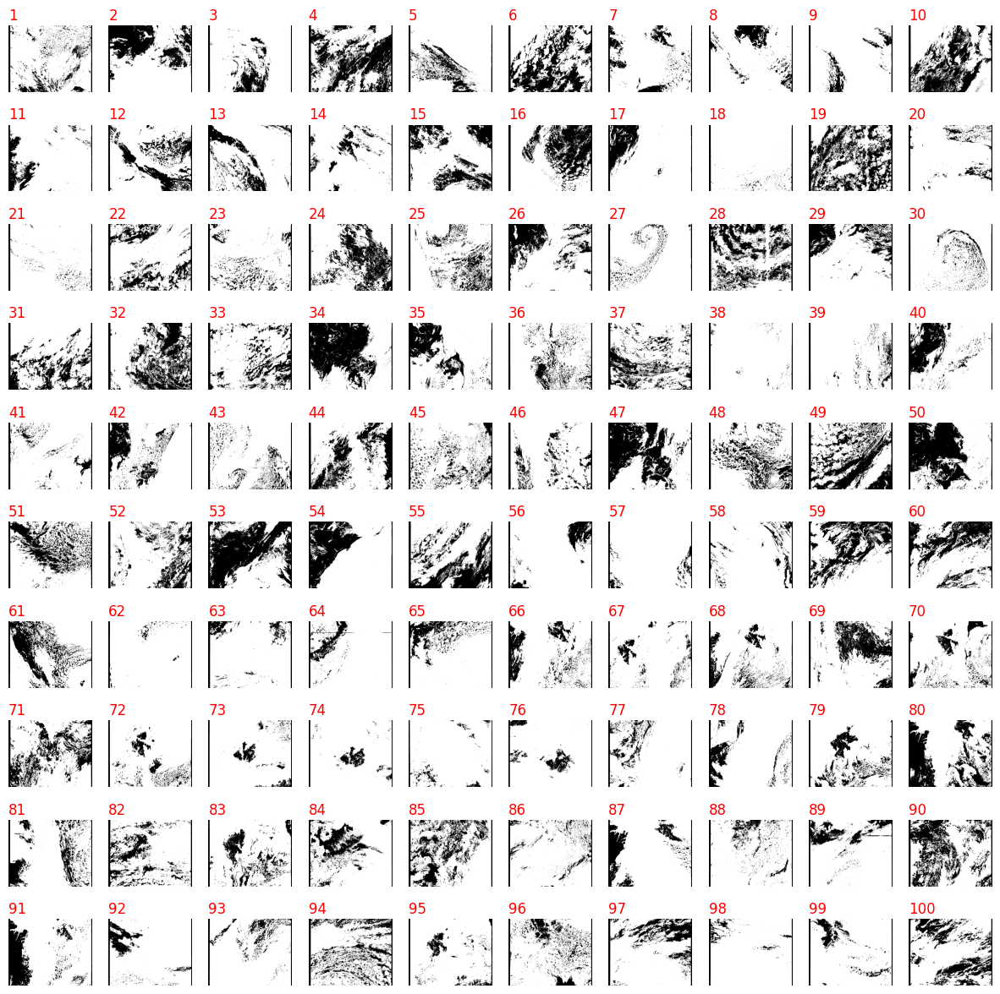

<Figure size 640x480 with 0 Axes>

In [20]:
plt = SLSTRFileNameParser.plot_image_matrix(inference_df, size=15, y_offset=-100, fontsize=12)

In [21]:
Shell.mkdir("images")

False

In [22]:
save_plot(plt, "./images/bw-inference-sort-by-counter")

<Figure size 640x480 with 0 Axes>

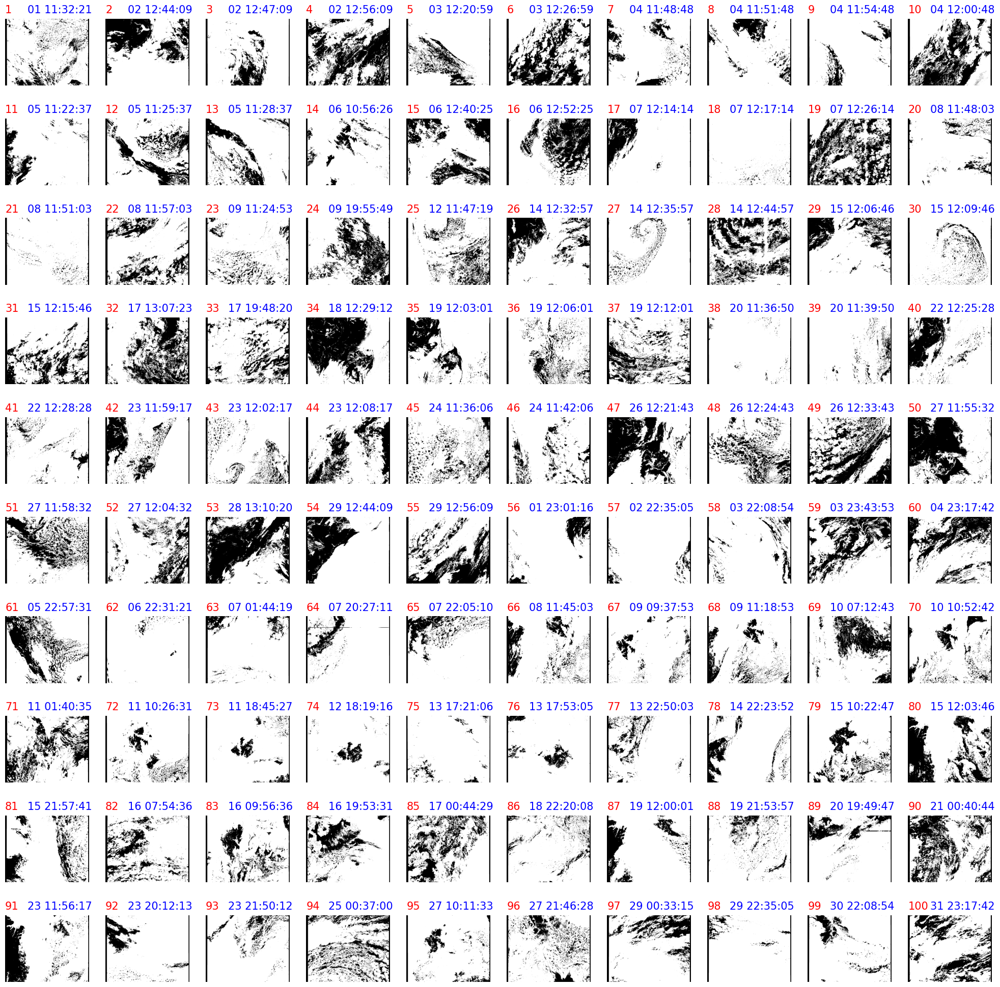

<module 'matplotlib.pyplot' from '/home/green/ENV3/lib/python3.10/site-packages/matplotlib/pyplot.py'>

<Figure size 640x480 with 0 Axes>

In [23]:
SLSTRFileNameParser.plot_image_matrix(inference_df, sort_by_time=False, display_time_in_title=True, size=25, fontsize=15, counter_in_title=True, y_offset=-100, dx=400)

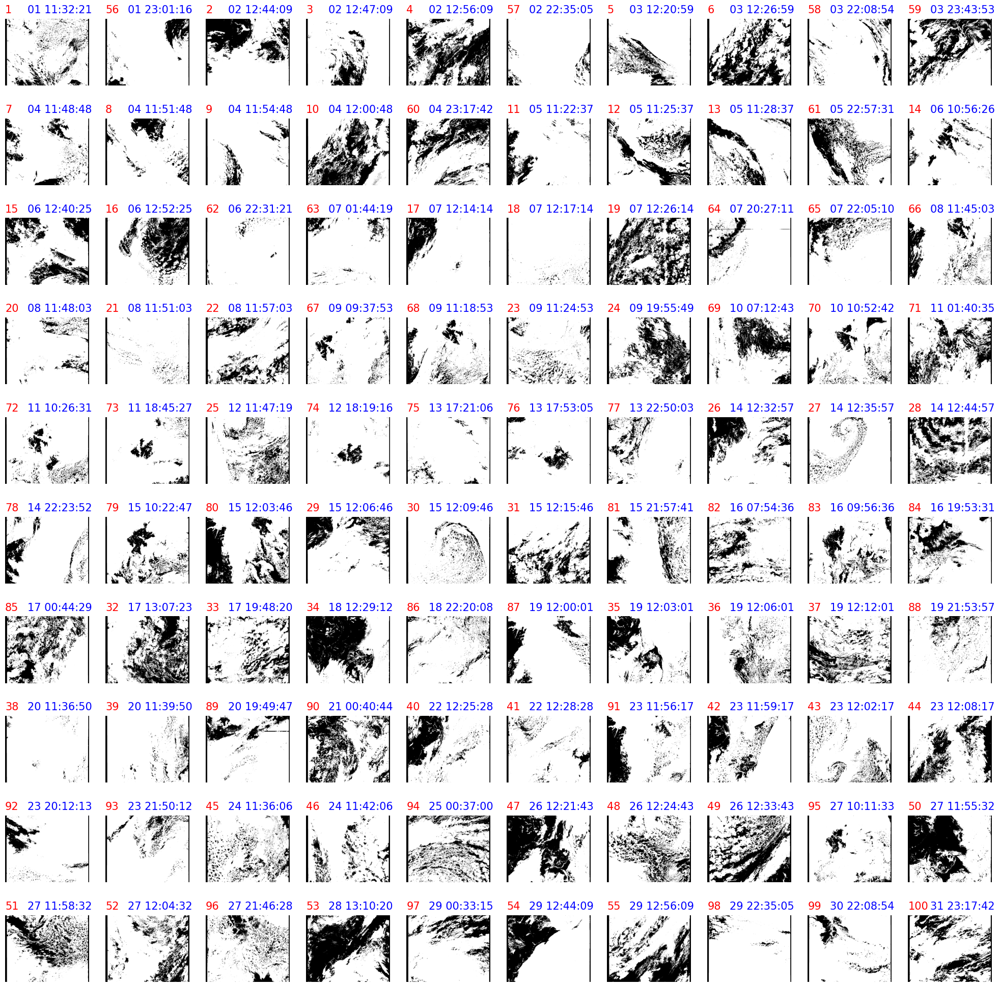

<module 'matplotlib.pyplot' from '/home/green/ENV3/lib/python3.10/site-packages/matplotlib/pyplot.py'>

<Figure size 640x480 with 0 Axes>

In [24]:
SLSTRFileNameParser.plot_image_matrix(inference_df, sort_by_time=True, display_time_in_title=True, size=25, fontsize=15, counter_in_title=True, y_offset=-100, dx=400)

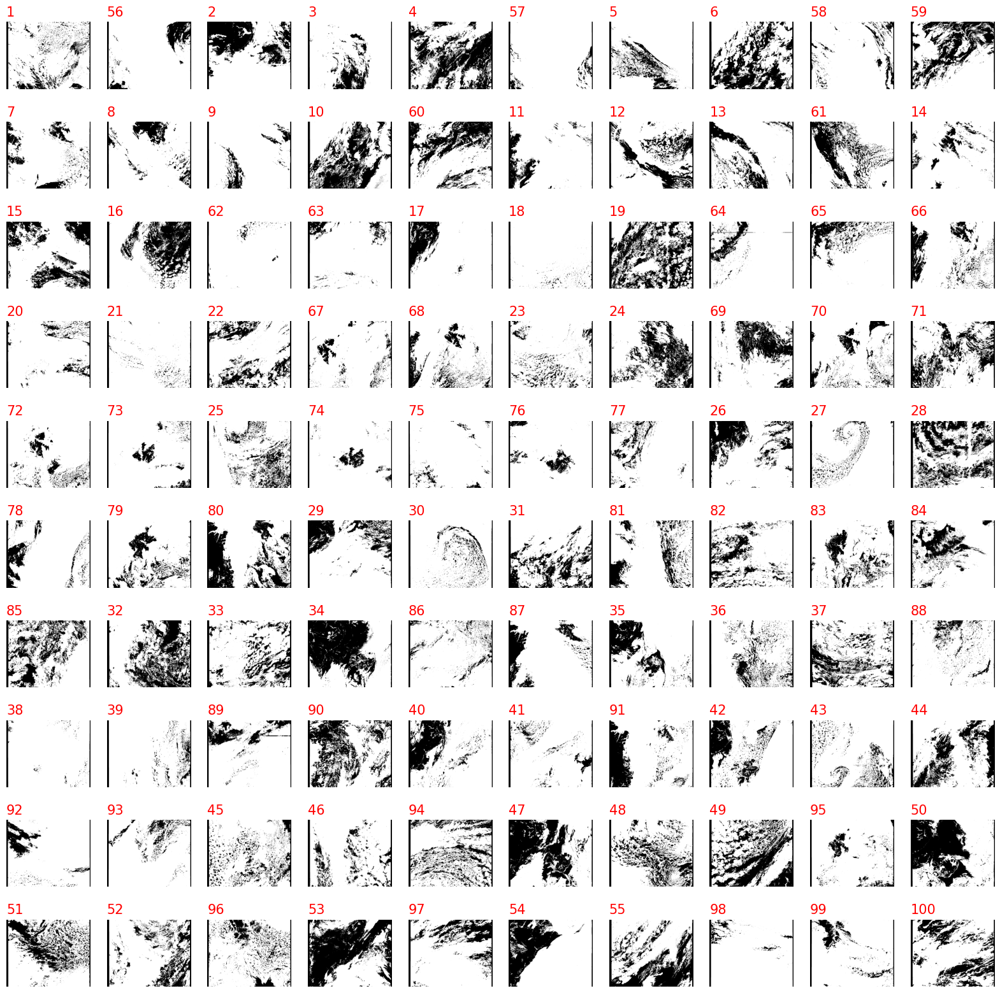

<module 'matplotlib.pyplot' from '/home/green/ENV3/lib/python3.10/site-packages/matplotlib/pyplot.py'>

<Figure size 640x480 with 0 Axes>

In [25]:
SLSTRFileNameParser.plot_image_matrix(inference_df, sort_by_time=True, display_time_in_title=False, size=20, y_offset=-100)

# Search & Download using EUMDAC API, from here below

In [26]:
datastore = eumdac.DataStore(token)
selected_collection = datastore.get_collection('EO:EUM:DAT:0615')

In [27]:
def search_SENTINEL3_product(df_entry):
    start_time = df_entry['start_time'].replace(second=0).to_pydatetime()
    start_time = start_time + timedelta(seconds=60)
    stop_time = start_time
    sat_type = None
    
    print('start_time:', start_time)
    
    if df_entry['mission_id']=='S3A':
        sat_type = 'Sentinel-3A'  
    else:
        raise Exception("mission_id (sat_type) unexpected, should be S3A")
    
    products = selected_collection.search(
        dtstart=start_time,
        dtend=stop_time,
        sat=sat_type
    )
    
    if len(products)!=1:
        raise Exception("Error 1: Search finds multiple products.")
        
    selected_product = None
    for product in products:
        try:
            if str(product)[:47]==df_entry['filename'][:47]:
                selected_product = product
                print(product)
                print('Verification Successful.')
            else:
                raise Exception("Error 2: Verfication Failed.")
        except eumdac.collection.CollectionError as error:
            print(f"Error related to the collection: '{error.msg}'")
        except requests.exceptions.ConnectionError as error:
            print(f"Error related to the connection: '{error.msg}'")
        except requests.exceptions.RequestException as error:
            print(f"Unexpected error: {error}")

    return selected_product

In [28]:
# Download two files: browse.jpg (raw image), xfdumanifest.xml (contains longitude, latitude)
def download_additional_data(selected_product, path=f'{DATA_DIR}/ssts-additional-info/'):
    files = ['browse.jpg', str(selected_product)+'/xfdumanifest.xml']
    os.makedirs(path+str(selected_product))
    
    try:
        for file in files:
            with selected_product.open(entry=file) as fsrc, open(path+str(selected_product)+'/'+fsrc.name, mode='wb') as fdst:
                shutil.copyfileobj(fsrc, fdst)
            print(f'Download of file {fsrc.name} finished.')
    except eumdac.product.ProductError as error:
        print(f"Error related to the product '{selected_product}' while trying to download it: '{error.msg}'")
    except requests.exceptions.ConnectionError as error:
        print(f"Error related to the connection: '{error.msg}'")
    except requests.exceptions.RequestException as error:
        print(f"Unexpected error: {error}")

In [29]:
from tqdm import tqdm

dir_exist = False

try:
    os.makedirs(f'{DATA_DIR}/ssts-additional-info/')
except:
    print(f'{DATA_DIR}/ssts-additional-info/',"exists. Terminating downloads...")
    dir_exist = True
    
if not dir_exist:
    # for i in tqdm(range(len(inference_df)), desc="Downloading esat iamges"):
    for i in range(len(inference_df)):
        try:
            # Find all 100 inference satellite image products
            selected_product = search_SENTINEL3_product(inference_df.iloc[i])

            # Download additional files
            download_additional_data(selected_product, f'{DATA_DIR}/ssts-additional-info/')

            print(i, 'completed -------------------------------------------')
        except:
            raise Exception(f"Download is experiencing error at i={i}. Download is completed up to i={i-1}.")


    banner ('SUCCESS')

/nfs/flash/mlcommons/data/ssts-additional-info/ exists. Terminating downloads...


# Extract Geo-Coordinates (Latitude, Longitude), from here below

In [30]:
additional_data_path = f'{DATA_DIR}/ssts-additional-info/'
new_file_list = [file[:47] for file in os.listdir(additional_data_path)]
# new_file_list

In [31]:
def update_dataframe_with_new_filename(dataframe, additional_data_path):
    df = dataframe.copy()
    new_file_list = [file for file in os.listdir(additional_data_path)]
    new_file_list_short = [file[:47] for file in os.listdir(additional_data_path)]
    df['new_filename'] = [None for i in range(len(df))]
    
    for i in range(len(df)):
        for j in range(len(new_file_list_short)):
            if df.iloc[i]['filename'][:47] == new_file_list_short[j]:
                df.loc[i, 'new_filename'] = new_file_list[j]

    return df

In [32]:
def extract_coordinates(dataframe, additional_data_path):
    df = dataframe.copy()
    df['min_latitude'] = [None for i in range(len(df))]
    df['max_latitude'] = [None for i in range(len(df))]
    df['min_longitude'] = [None for i in range(len(df))]
    df['max_longitude'] = [None for i in range(len(df))]

    for i in range(len(df)):
        with open(additional_data_path + df.iloc[i]['new_filename'] + '/xfdumanifest.xml', 'r') as f:
            data = f.read()
        long_str = data.strip().split('gml:posList')[1][1:-2]
        long_list = long_str.strip().split(' ')
        long_list = [float(coor) for coor in long_list]
        list1 = long_list[::2]
        list2 = long_list[1::2]
        
        df.loc[i, 'min_latitude'] = min(list1)
        df.loc[i, 'max_latitude'] = max(list1)
        df.loc[i, 'min_longitude'] = min(list2)
        df.loc[i, 'max_longitude'] = max(list2)
        
    return df

In [33]:
# thsi is wrong files must all be relative to esat and data_dir or . ? maybe ok if we document better

inference_df = update_dataframe_with_new_filename(inference_df, f'{DATA_DIR}/ssts-additional-info/')
inference_df = extract_coordinates(inference_df, f'{DATA_DIR}/ssts-additional-info/')
inference_df

,counter,daylight,start_time,stop_time,dt_m,filename,mission_id,data_source,processing_level,data_type_id,...,instance_id,center_id,class_id,file_extension,hdf_file,new_filename,min_latitude,max_latitude,min_longitude,max_longitude
0,1,day,2019-10-01 11:32:21,2019-10-01 11:35:21,3.0,S3A_SL_1_RBT____20191001T113221_20191001T11352...,S3A,SL,1,RBT,...,0179_050_023_1980,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191001T113221_20191001T11352...,49.3736,62.9199,-27.3277,1.10981
1,2,day,2019-10-02 12:44:09,2019-10-02 12:47:09,3.0,S3A_SL_1_RBT____20191002T124409_20191002T12470...,S3A,SL,1,RBT,...,0180_050_038_1800,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T124409_20191002T12470...,59.3336,73.3693,-44.6162,-4.17663
2,3,day,2019-10-02 12:47:09,2019-10-02 12:50:09,3.0,S3A_SL_1_RBT____20191002T124709_20191002T12500...,S3A,SL,1,RBT,...,0179_050_038_1980,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T124709_20191002T12500...,49.3902,62.9367,-46.0283,-17.5778
3,4,day,2019-10-02 12:56:09,2019-10-02 12:59:09,3.0,S3A_SL_1_RBT____20191002T125609_20191002T12590...,S3A,SL,1,RBT,...,0179_050_038_2520,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T125609_20191002T12590...,18.1641,31.4999,-51.0993,-34.0545
4,5,day,2019-10-03 12:20:59,2019-10-03 12:23:59,3.0,S3A_SL_1_RBT____20191003T122059_20191003T12235...,S3A,SL,1,RBT,...,0179_050_052_1980,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191003T122059_20191003T12235...,49.3862,62.9326,-39.4834,-11.0361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,night,2019-10-27 21:46:28,2019-10-27 21:49:28,3.0,S3A_SL_1_RBT____20191027T214628_20191027T21492...,S3A,SL,1,RBT,...,0179_051_015_0900,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191027T214628_20191027T21492...,51.3203,64.9458,-23.332,6.80277
96,97,night,2019-10-29 00:33:15,2019-10-29 00:36:15,3.0,S3A_SL_1_RBT____20191029T003315_20191029T00361...,S3A,SL,1,RBT,...,0179_051_031_0360,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191029T003315_20191029T00361...,20.1914,33.5177,-49.4951,-32.1538
97,98,night,2019-10-29 22:35:05,2019-10-29 22:38:05,3.0,S3A_SL_1_RBT____20191029T223505_20191029T22380...,S3A,SL,1,RBT,...,0179_051_044_0900,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191029T223505_20191029T22380...,51.3303,64.9386,-35.4784,-5.35265
98,99,night,2019-10-30 22:08:54,2019-10-30 22:11:54,3.0,S3A_SL_1_RBT____20191030T220854_20191030T22115...,S3A,SL,1,RBT,...,0179_051_058_0900,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191030T220854_20191030T22115...,51.3245,64.9323,-28.9257,1.19417


In [34]:
# Function to calculate Haversine distance
def haversine(lat1, lon1, lat2, lon2):
    R = 6371  # Radius of Earth in kilometers

    dlat = np.radians(lat2 - lat1)
    dlon = np.radians(lon2 - lon1)

    a = np.sin(dlat/2) * np.sin(dlat/2) + np.cos(np.radians(lat1)) * np.cos(np.radians(lat2)) * np.sin(dlon/2) * np.sin(dlon/2)
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))

    distance = R * c  # Distance in kilometers

    # Area of a rectangle on the Earth's surface
    area = distance * distance

    return area

inference_df['area'] = inference_df.apply(lambda row: haversine(row['min_latitude'], row['min_longitude'], row['max_latitude'], row['max_longitude']), axis=1)


inference_df['d_latitude'] = inference_df['max_latitude'] - inference_df['min_latitude']
inference_df['d_longitude'] = inference_df['max_longitude'] - inference_df['min_longitude']

inference_df

,counter,daylight,start_time,stop_time,dt_m,filename,mission_id,data_source,processing_level,data_type_id,...,file_extension,hdf_file,new_filename,min_latitude,max_latitude,min_longitude,max_longitude,area,d_latitude,d_longitude
0,1,day,2019-10-01 11:32:21,2019-10-01 11:35:21,3.0,S3A_SL_1_RBT____20191001T113221_20191001T11352...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191001T113221_20191001T11352...,49.3736,62.9199,-27.3277,1.10981,5.217462e+06,13.5463,28.43751
1,2,day,2019-10-02 12:44:09,2019-10-02 12:47:09,3.0,S3A_SL_1_RBT____20191002T124409_20191002T12470...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T124409_20191002T12470...,59.3336,73.3693,-44.6162,-4.17663,5.312405e+06,14.0357,40.43957
2,3,day,2019-10-02 12:47:09,2019-10-02 12:50:09,3.0,S3A_SL_1_RBT____20191002T124709_20191002T12500...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T124709_20191002T12500...,49.3902,62.9367,-46.0283,-17.5778,5.217480e+06,13.5465,28.4505
3,4,day,2019-10-02 12:56:09,2019-10-02 12:59:09,3.0,S3A_SL_1_RBT____20191002T125609_20191002T12590...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T125609_20191002T12590...,18.1641,31.4999,-51.0993,-34.0545,5.131625e+06,13.3358,17.0448
4,5,day,2019-10-03 12:20:59,2019-10-03 12:23:59,3.0,S3A_SL_1_RBT____20191003T122059_20191003T12235...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191003T122059_20191003T12235...,49.3862,62.9326,-39.4834,-11.0361,5.217449e+06,13.5464,28.4473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,night,2019-10-27 21:46:28,2019-10-27 21:49:28,3.0,S3A_SL_1_RBT____20191027T214628_20191027T21492...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191027T214628_20191027T21492...,51.3203,64.9458,-23.332,6.80277,5.244646e+06,13.6255,30.13477
96,97,night,2019-10-29 00:33:15,2019-10-29 00:36:15,3.0,S3A_SL_1_RBT____20191029T003315_20191029T00361...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191029T003315_20191029T00361...,20.1914,33.5177,-49.4951,-32.1538,5.126915e+06,13.3263,17.3413
97,98,night,2019-10-29 22:35:05,2019-10-29 22:38:05,3.0,S3A_SL_1_RBT____20191029T223505_20191029T22380...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191029T223505_20191029T22380...,51.3303,64.9386,-35.4784,-5.35265,5.237199e+06,13.6083,30.12575
98,99,night,2019-10-30 22:08:54,2019-10-30 22:11:54,3.0,S3A_SL_1_RBT____20191030T220854_20191030T22115...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191030T220854_20191030T22115...,51.3245,64.9323,-28.9257,1.19417,5.236970e+06,13.6078,30.11987


/tmp/ipykernel_359254/817809240.py:18: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


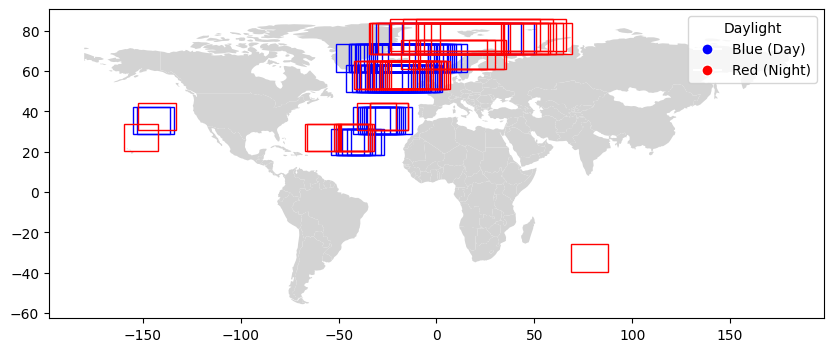

In [35]:
df = inference_df

gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy((df.min_longitude + df.max_longitude) / 2, (df.min_latitude + df.max_latitude) / 2))

gdf['color'] = 'blue'
gdf.loc[df['daylight'] != 'day', 'color'] = 'red'


# Set the coordinate reference system (CRS)
# Note: The CRS should match the coordinate system of the latitude and longitude values
gdf.crs = "EPSG:4326"
# gdf.crs = "EPSG:3395" # Mercator
# gdf.crs = "EPSG:3857"


bounds = gdf.total_bounds

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ax = world.cx[bounds[0]:bounds[2], bounds[1]:bounds[3]].plot(figsize=(10, 5), color='lightgrey')
# gdf.plot(ax=ax, marker='o', color='red', markersize=50)

from matplotlib.patches import Rectangle

for index, row in gdf.iterrows():
    rect = Rectangle((row['min_longitude'], row['min_latitude']),
                     row['max_longitude'] - row['min_longitude'],
                     row['max_latitude'] - row['min_latitude'],
                     edgecolor=row['color'], facecolor='none')
    ax.add_patch(rect)


# Add legend
legend_labels = {'day': 'Blue (Day)', 'night': 'Red (Night)'}
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=8, label=legend_labels['day']),
                  plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label=legend_labels['night'])]

ax.legend(handles=legend_handles, title='Daylight', loc='upper right')

# save_plot(plt, "images/inference-frames", dpi=300)


plt.savefig("images/inference-frames.png")
plt.show()

In [36]:
gdf

,counter,daylight,start_time,stop_time,dt_m,filename,mission_id,data_source,processing_level,data_type_id,...,new_filename,min_latitude,max_latitude,min_longitude,max_longitude,area,d_latitude,d_longitude,geometry,color
0,1,day,2019-10-01 11:32:21,2019-10-01 11:35:21,3.0,S3A_SL_1_RBT____20191001T113221_20191001T11352...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191001T113221_20191001T11352...,49.3736,62.9199,-27.3277,1.10981,5.217462e+06,13.5463,28.43751,POINT (-13.10895 56.14675),blue
1,2,day,2019-10-02 12:44:09,2019-10-02 12:47:09,3.0,S3A_SL_1_RBT____20191002T124409_20191002T12470...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191002T124409_20191002T12470...,59.3336,73.3693,-44.6162,-4.17663,5.312405e+06,14.0357,40.43957,POINT (-24.39642 66.35145),blue
2,3,day,2019-10-02 12:47:09,2019-10-02 12:50:09,3.0,S3A_SL_1_RBT____20191002T124709_20191002T12500...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191002T124709_20191002T12500...,49.3902,62.9367,-46.0283,-17.5778,5.217480e+06,13.5465,28.4505,POINT (-31.80305 56.16345),blue
3,4,day,2019-10-02 12:56:09,2019-10-02 12:59:09,3.0,S3A_SL_1_RBT____20191002T125609_20191002T12590...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191002T125609_20191002T12590...,18.1641,31.4999,-51.0993,-34.0545,5.131625e+06,13.3358,17.0448,POINT (-42.57690 24.83200),blue
4,5,day,2019-10-03 12:20:59,2019-10-03 12:23:59,3.0,S3A_SL_1_RBT____20191003T122059_20191003T12235...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191003T122059_20191003T12235...,49.3862,62.9326,-39.4834,-11.0361,5.217449e+06,13.5464,28.4473,POINT (-25.25975 56.15940),blue
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,night,2019-10-27 21:46:28,2019-10-27 21:49:28,3.0,S3A_SL_1_RBT____20191027T214628_20191027T21492...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191027T214628_20191027T21492...,51.3203,64.9458,-23.332,6.80277,5.244646e+06,13.6255,30.13477,POINT (-8.26462 58.13305),red
96,97,night,2019-10-29 00:33:15,2019-10-29 00:36:15,3.0,S3A_SL_1_RBT____20191029T003315_20191029T00361...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191029T003315_20191029T00361...,20.1914,33.5177,-49.4951,-32.1538,5.126915e+06,13.3263,17.3413,POINT (-40.82445 26.85455),red
97,98,night,2019-10-29 22:35:05,2019-10-29 22:38:05,3.0,S3A_SL_1_RBT____20191029T223505_20191029T22380...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191029T223505_20191029T22380...,51.3303,64.9386,-35.4784,-5.35265,5.237199e+06,13.6083,30.12575,POINT (-20.41552 58.13445),red
98,99,night,2019-10-30 22:08:54,2019-10-30 22:11:54,3.0,S3A_SL_1_RBT____20191030T220854_20191030T22115...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191030T220854_20191030T22115...,51.3245,64.9323,-28.9257,1.19417,5.236970e+06,13.6078,30.11987,POINT (-13.86576 58.12840),red


/tmp/ipykernel_359254/2142380745.py:17: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


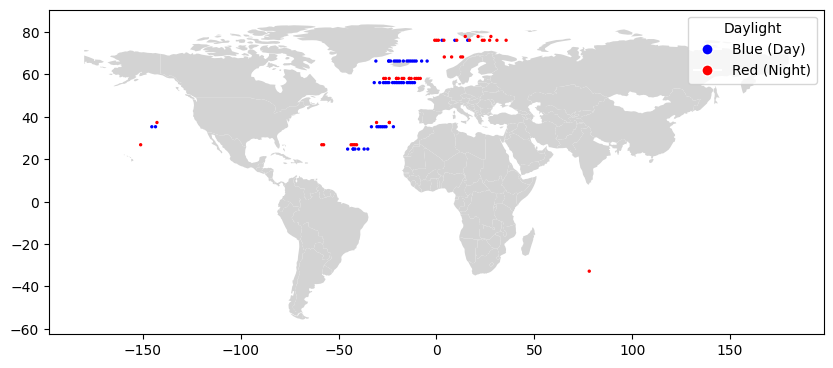

In [37]:

import matplotlib.pyplot as plt

# Assuming you already have the DataFrame df
# ...

# Assuming df.daylight is a column in your DataFrame
# If it's not, replace df.daylight with the correct column name
gdf['color'] = 'blue'
gdf.loc[df['daylight'] != 'day', 'color'] = 'red'

# Set the coordinate reference system (CRS)
# Note: The CRS should match the coordinate system of the latitude and longitude values
gdf.crs = "EPSG:4326"

bounds = gdf.total_bounds

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ax = world.cx[bounds[0]:bounds[2], bounds[1]:bounds[3]].plot(figsize=(10, 5), color='lightgrey')
gdf.plot(ax=ax, marker='o', color=gdf['color'], markersize=2)

# Add legend
legend_labels = {'day': 'Blue (Day)', 'night': 'Red (Night)'}
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=8, label=legend_labels['day']),
                  plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label=legend_labels['night'])]

ax.legend(handles=legend_handles, title='Daylight', loc='upper right')

plt.savefig("images/inference-dots")

plt.show()

/tmp/ipykernel_359254/2231805759.py:18: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


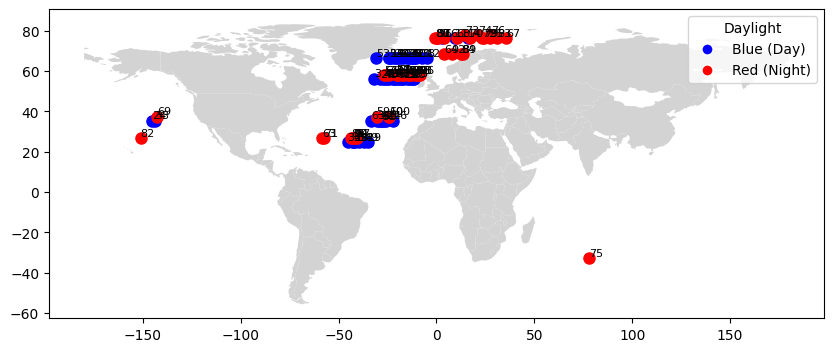

In [38]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming you already have the DataFrame df
# ...

# Assuming df.daylight is a column in your DataFrame
# If it's not, replace df.daylight with the correct column name
gdf['color'] = 'blue'
gdf.loc[df['daylight'] != 'day', 'color'] = 'red'

# Set the coordinate reference system (CRS)
# Note: The CRS should match the coordinate system of the latitude and longitude values
gdf.crs = "EPSG:4326"

bounds = gdf.total_bounds

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ax = world.cx[bounds[0]:bounds[2], bounds[1]:bounds[3]].plot(figsize=(10, 5), color='lightgrey')

# Plot markers on the map and add counter values
for index, row in gdf.iterrows():
    ax.plot(row['geometry'].x, row['geometry'].y, marker='o', color=row['color'], markersize=8)
    ax.text(row['geometry'].x, row['geometry'].y, str(row['counter']), fontsize=8, ha='left', va='bottom')

# Add legend
legend_labels = {'day': 'Blue (Day)', 'night': 'Red (Night)'}
legend_handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=8, label=legend_labels['day']),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label=legend_labels['night'])
]

ax.legend(handles=legend_handles, title='Daylight', loc='upper right')

plt.show()


In [39]:
import folium
from folium.plugins import MarkerCluster

# Assuming you already have the GeoDataFrame gdf

def data_string(data, values):
    s = ""
    for v in values:
        s = s + f"{v}: {data[v]}\n"
    return s

def set_folium_title(mymap, title):
    title_html = f'''
    <h3 style="text-align:center;">{title}</h3>
    '''
    mymap.get_root().html.add_child(folium.Element(title_html))

# Create a Folium Map centered around the mean latitude and longitude
map_center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
mymap = folium.Map(location=map_center, zoom_start=0)

# Add a Marker Cluster to the map
marker_cluster = MarkerCluster().add_to(mymap)

# Add markers for each point in the GeoDataFrame
for idx, row in gdf.iterrows():
    marker_color = 'blue' if row['daylight'] == 'day' else 'red'
    folium.Marker(
        location=[row['geometry'].y, row['geometry'].x],
        popup=data_string(row, ["counter", "daylight", "min_latitude", "max_latitude", "min_latitude", "max_latitude"]),
        icon=folium.Icon(color=marker_color),
    ).add_to(marker_cluster)

# Add satellite imagery tile layer
tile = folium.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Esri',
    name='Esri Satellite',
    overlay=False,
    control=True
).add_to(mymap)

set_folium_title(mymap, "Satellite Map with Image Locations used in Inference & Data as Popup")

mymap.fit_bounds(mymap.get_bounds())
mymap


In [40]:
import folium
from folium.plugins import MarkerCluster

# Assuming you already have the GeoDataFrame gdf

def data_string(data, values):
    s = ""
    for v in values:
        s = s + f"{v}: {data[v]}\n"
    return s

# Create a Folium Map centered around the mean latitude and longitude
map_center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
mymap = folium.Map(location=map_center, zoom_start=0)

# Add a Marker Cluster to the map
marker_cluster = MarkerCluster().add_to(mymap)

# Add markers for each point in the GeoDataFrame
for idx, row in gdf.iterrows():
    marker_color = 'blue' if row['daylight'] == 'day' else 'red'
    folium.Marker(
        location=[row['geometry'].y, row['geometry'].x],
        popup=data_string(row, ["counter", "daylight", "min_latitude", "max_latitude", "min_latitude", "max_latitude"]),
        icon=folium.Icon(color=marker_color),
    ).add_to(marker_cluster)

    folium.vector_layers.Rectangle(
        bounds=[(row['min_latitude'], row['min_longitude']), (row['max_latitude'], row['max_longitude'])],
        color=marker_color,
        fill=True,
        fill_color=marker_color,
        fill_opacity=0.2,
        popup=f"Area: {data_string(row, ['min_latitude', 'max_latitude', 'min_longitude', 'max_longitude'])}",
    ).add_to(mymap)

tile = folium.TileLayer(
        tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr = 'Esri',
        name = 'Esri Satellite',
        overlay = False,
        control = True
       ).add_to(mymap)

set_folium_title(mymap, "Satellite Map with Image Frames used in Inference & Data as Popup")

mymap.fit_bounds(mymap.get_bounds())
mymap


In [41]:
folium.__version__

'0.15.1'

In [42]:
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

# Assuming you already have the DataFrame df
# ...

# Assuming df.daylight is a column in your DataFrame
# If it's not, replace df.daylight with the correct column name
gdf['color'] = 'blue'
gdf.loc[df['daylight'] != 'day', 'color'] = 'red'

# Set the coordinate reference system (CRS)
# Note: The CRS should match the coordinate system of the latitude and longitude values
gdf.crs = "EPSG:4326"

# Create a Folium Map centered around the mean latitude and longitude
map_center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
mymap = folium.Map(location=map_center, zoom_start=5)

# Add a Marker Cluster to the map
marker_cluster = MarkerCluster().add_to(mymap)

# Add markers for each point in the GeoDataFrame
for idx, row in gdf.iterrows():
    folium.Marker(
        location=[row['geometry'].y, row['geometry'].x],
        popup=str(row['counter']),
        icon=folium.Icon(color=row['color']),
    ).add_to(marker_cluster)

# Add legend
legend_html = f'''
<div style="position: fixed; top: 50px; right: 50px; z-index: 1000; background-color:white; padding: 10px; border: 1px solid grey; border-radius: 5px;">
    <p><strong>Legend</strong></p>
    <p><i class="fas fa-circle" style="color: blue;"></i> Day</p>
    <p><i class="fas fa-circle" style="color: red;"></i> Night</p>
</div>
'''
mymap.get_root().html.add_child(folium.Element(legend_html))

set_folium_title(mymap, "Map with Image Locations used in Inference & Data as Popup")

mymap.fit_bounds(mymap.get_bounds())
mymap


In [43]:
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

# Assuming you already have the DataFrame df
# ...

# Assuming df.daylight is a column in your DataFrame
# If it's not, replace df.daylight with the correct column name
gdf['color'] = 'blue'
gdf.loc[df['daylight'] != 'day', 'color'] = 'red'

# Set the coordinate reference system (CRS)
# Note: The CRS should match the coordinate system of the latitude and longitude values
gdf.crs = "EPSG:4326"

# Create a Folium Map centered around the mean latitude and longitude
map_center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
mymap = folium.Map(location=map_center)

# Add a Marker Cluster to the map
marker_cluster = MarkerCluster().add_to(mymap)

# Add markers for each point in the GeoDataFrame
for idx, row in gdf.iterrows():
    circle_marker = folium.Marker(
        location=[row['geometry'].y, row['geometry'].x],
        #radius=5,  # Adjust the radius as needed
        popup=str(row['counter']),
        #color=row['color'],
        #fill=True,
        #fill_color=row['color'],
        #fill_opacity=1.0,
        icon=folium.DivIcon(html=f"<div style='font-size: 12px; color: {row['color']}'>{row['counter']}</div>"
        )
    )
    marker_cluster.add_child(circle_marker)

# Add legend
legend_html = f'''
<div style="position: fixed; top: 50px; right: 50px; z-index: 1000; background-color:white; padding: 10px; border: 1px solid grey; border-radius: 5px;">
    <p><strong>Legend</strong></p>
    <p><i class="fas fa-circle" style="color: blue;"></i> Day</p>
    <p><i class="fas fa-circle" style="color: red;"></i> Night</p>
</div>
'''
mymap.get_root().html.add_child(folium.Element(legend_html))

mymap.fit_bounds(mymap.get_bounds())

set_folium_title(mymap, "Map with Image Location Counter when Zoomed in used in Inference & Data as Popup")

# Display the map
mymap


In [44]:
import geopandas as gpd
import folium

fontsize = 6
# Assuming you already have the DataFrame df
# ...

# Assuming df.daylight is a column in your DataFrame
# If it's not, replace df.daylight with the correct column name
gdf['color'] = 'blue'
gdf.loc[df['daylight'] != 'day', 'color'] = 'red'

# Set the coordinate reference system (CRS)
# Note: The CRS should match the coordinate system of the latitude and longitude values
gdf.crs = "EPSG:4326"

# Create a Folium Map centered around the mean latitude and longitude
map_center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
mymap = folium.Map(location=map_center, zoom_start=5)

# Add markers for each point in the GeoDataFrame
for idx, row in gdf.iterrows():
    circle_marker = folium.Marker(
        location=[row['geometry'].y, row['geometry'].x],
        popup=str(row['counter']),
        icon=folium.DivIcon(html=f"<div style='font-size: {fontsize}px; color: {row['color']}'>{row['counter']}</div>"
        )
    )
    circle_marker.add_to(mymap)

# Add legend
legend_html = f'''
<div style="position: fixed; top: 50px; right: 50px; z-index: 1000; background-color:white; padding: 10px; border: 1px solid grey; border-radius: 5px;">
    <p><strong>Legend</strong></p>
    <p><i class="fas fa-circle" style="color: blue;"></i> Day</p>
    <p><i class="fas fa-circle" style="color: red;"></i> Night</p>
</div>
'''
mymap.get_root().html.add_child(folium.Element(legend_html))

set_folium_title(mymap, "Map with Image Location Counter used in Inference & Data as Popup")

mymap.fit_bounds(mymap.get_bounds())

# Display the map in Jupyter Notebook
plt.show()

# Save the Matplotlib plot as an image
plt.savefig('folium_map_screenshot.png', bbox_inches='tight', pad_inches=0.1)


mymap


<Figure size 640x480 with 0 Axes>

In [45]:
plt.savefig("images/inference-satelite")

<Figure size 640x480 with 0 Axes>

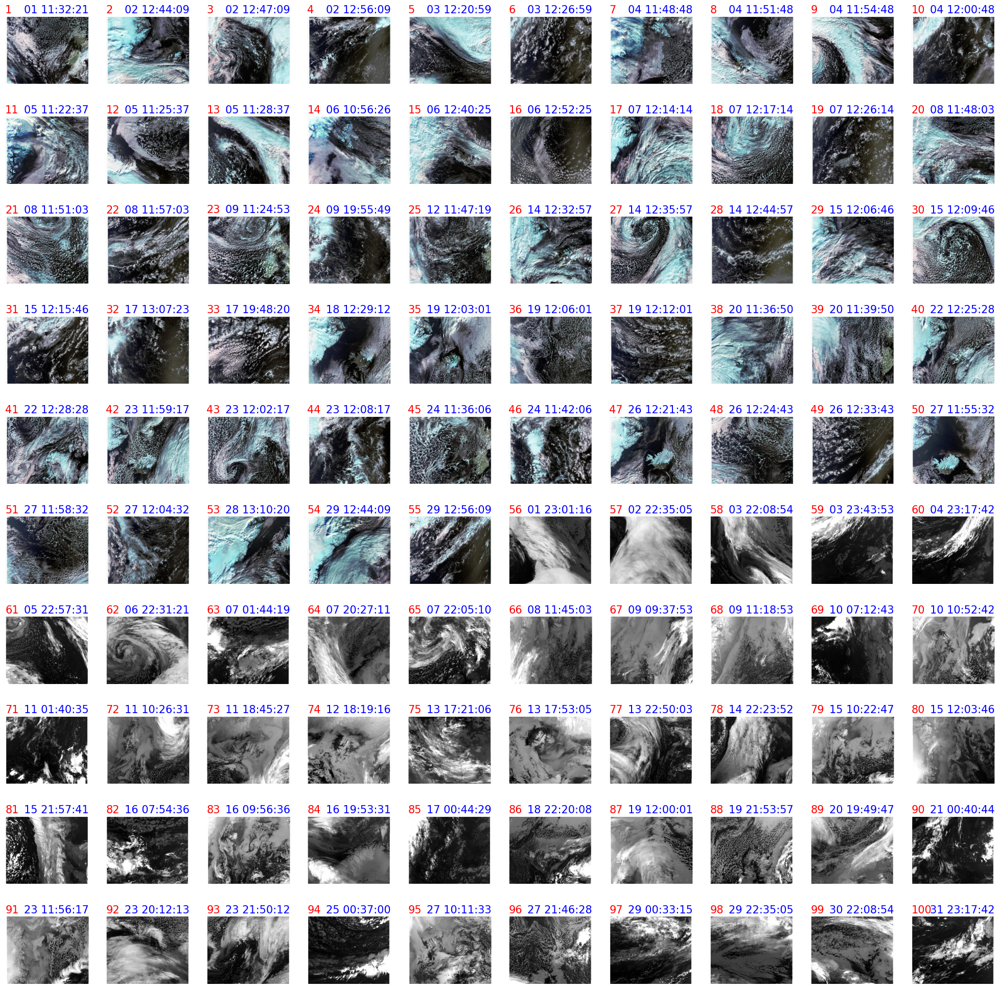

In [46]:
import matplotlib.pyplot as plt
import matplotlib.image as img


def plot_image_matrix(dataframe, additional_data_path=None, image_name='/browse.jpg', sort_by_time=False, display_time_in_title=False, size=15, fontsize=15, x_offset=0, y_offset=0, dx=100, counter_in_title=True, filename="images/raw_inference_image_matrix.png"):
    if sort_by_time:
        dataframe = dataframe.sort_values(by=['start_time'])


    fig, axs = plt.subplots(10, 10, figsize=(size, size))
    for i in range(100):
        image = img.imread(additional_data_path + dataframe.iloc[i]['new_filename'] + image_name)
        row, col = divmod(i, 10)
        axs[row][col].imshow(image)

        if counter_in_title:
            label = str(dataframe.iloc[i]['counter'])
            axs[row][col].text(x_offset, y_offset, label, color='red', fontsize=fontsize)

        if display_time_in_title:
            # time = dataframe.iloc[i]['start_time'].strftime('%Y-%m-%d %H:%M:%S')
            label = dataframe.iloc[i]['start_time'].strftime('%d %H:%M:%S')
            axs[row][col].text(x_offset + dx, y_offset, label, color='blue', fontsize=fontsize)

        axs[row][col].axis('off')

    # plt.show()
    plt.savefig('raw_inference_image_matrix.png', dpi=500)

plot_image_matrix(inference_df, additional_data_path=f'{DATA_DIR}/ssts-additional-info/', size=25, y_offset=-20, counter_in_title=True, display_time_in_title=True)

In [55]:
inference_df


,counter,daylight,start_time,stop_time,dt_m,filename,mission_id,data_source,processing_level,data_type_id,...,file_extension,hdf_file,new_filename,min_latitude,max_latitude,min_longitude,max_longitude,area,d_latitude,d_longitude
0,1,day,2019-10-01 11:32:21,2019-10-01 11:35:21,3.0,S3A_SL_1_RBT____20191001T113221_20191001T11352...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191001T113221_20191001T11352...,49.3736,62.9199,-27.3277,1.10981,5.217462e+06,13.5463,28.43751
1,2,day,2019-10-02 12:44:09,2019-10-02 12:47:09,3.0,S3A_SL_1_RBT____20191002T124409_20191002T12470...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T124409_20191002T12470...,59.3336,73.3693,-44.6162,-4.17663,5.312405e+06,14.0357,40.43957
2,3,day,2019-10-02 12:47:09,2019-10-02 12:50:09,3.0,S3A_SL_1_RBT____20191002T124709_20191002T12500...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T124709_20191002T12500...,49.3902,62.9367,-46.0283,-17.5778,5.217480e+06,13.5465,28.4505
3,4,day,2019-10-02 12:56:09,2019-10-02 12:59:09,3.0,S3A_SL_1_RBT____20191002T125609_20191002T12590...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T125609_20191002T12590...,18.1641,31.4999,-51.0993,-34.0545,5.131625e+06,13.3358,17.0448
4,5,day,2019-10-03 12:20:59,2019-10-03 12:23:59,3.0,S3A_SL_1_RBT____20191003T122059_20191003T12235...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191003T122059_20191003T12235...,49.3862,62.9326,-39.4834,-11.0361,5.217449e+06,13.5464,28.4473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,night,2019-10-27 21:46:28,2019-10-27 21:49:28,3.0,S3A_SL_1_RBT____20191027T214628_20191027T21492...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191027T214628_20191027T21492...,51.3203,64.9458,-23.332,6.80277,5.244646e+06,13.6255,30.13477
96,97,night,2019-10-29 00:33:15,2019-10-29 00:36:15,3.0,S3A_SL_1_RBT____20191029T003315_20191029T00361...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191029T003315_20191029T00361...,20.1914,33.5177,-49.4951,-32.1538,5.126915e+06,13.3263,17.3413
97,98,night,2019-10-29 22:35:05,2019-10-29 22:38:05,3.0,S3A_SL_1_RBT____20191029T223505_20191029T22380...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191029T223505_20191029T22380...,51.3303,64.9386,-35.4784,-5.35265,5.237199e+06,13.6083,30.12575
98,99,night,2019-10-30 22:08:54,2019-10-30 22:11:54,3.0,S3A_SL_1_RBT____20191030T220854_20191030T22115...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191030T220854_20191030T22115...,51.3245,64.9323,-28.9257,1.19417,5.236970e+06,13.6078,30.11987


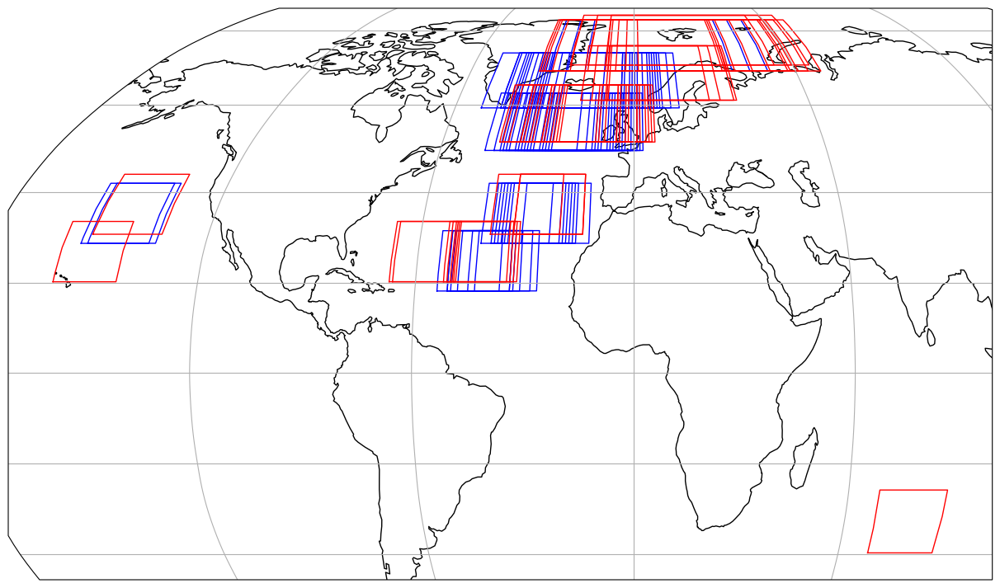

In [156]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

def plot_rectangles_on_projection(df, scale=3, projection=ccrs.Robinson()):
    
    # Create a figure and axis with Robinson projection
    fig, ax = plt.subplots(figsize=(scale * 5.12985642927, scale * 3), subplot_kw={'projection': projection})

    # Add coastlines and gridlines
    ax.coastlines(resolution='110m')
    ax.gridlines()

    # Create an instance of the Robinson projection
    robinson_proj = ccrs.Robinson()

    # Plot rectangles for each area
    for index, row in df.iterrows():
        min_lat, max_lat = row['min_latitude'], row['max_latitude']
        min_lon, max_lon = row['min_longitude'], row['max_longitude']
        daylight = row['daylight']

        # Determine the color based on daylight
        color = 'blue' if daylight == 'day' else 'red'

        # Plot lines to form a rectangle
        ax.plot([min_lon, max_lon, max_lon, min_lon, min_lon], [min_lat, min_lat, max_lat, max_lat, min_lat],
                color=color, linewidth=1, transform=ccrs.PlateCarree())

    # Set aspect ratio manually
    ax.set_aspect('auto')

    # Show the plot
    plt.show()


# Call the function with your DataFrame
plot_rectangles_on_projection(inference_df, projection=ccrs.Robinson())


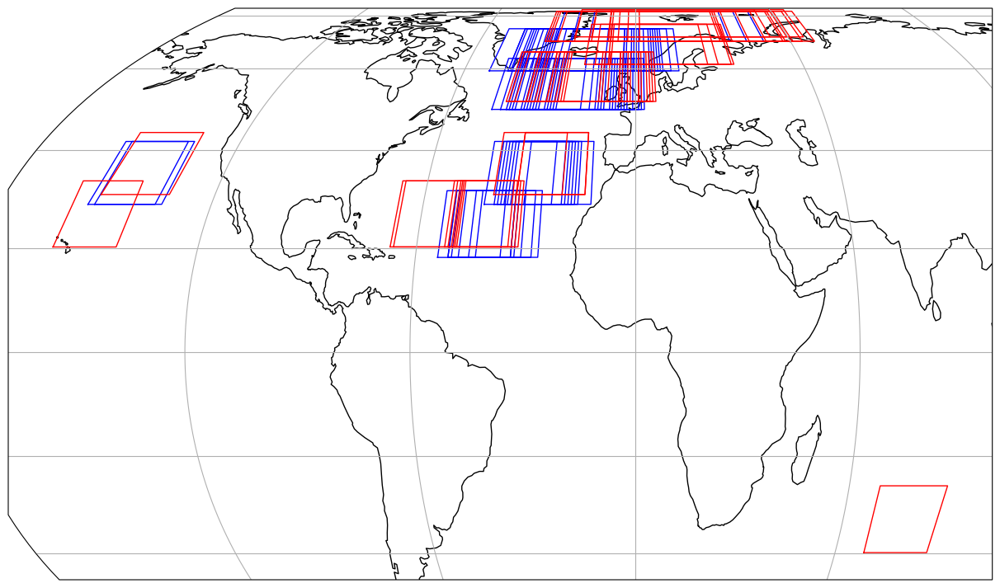

In [157]:
plot_rectangles_on_projection(inference_df, projection=ccrs.EqualEarth())

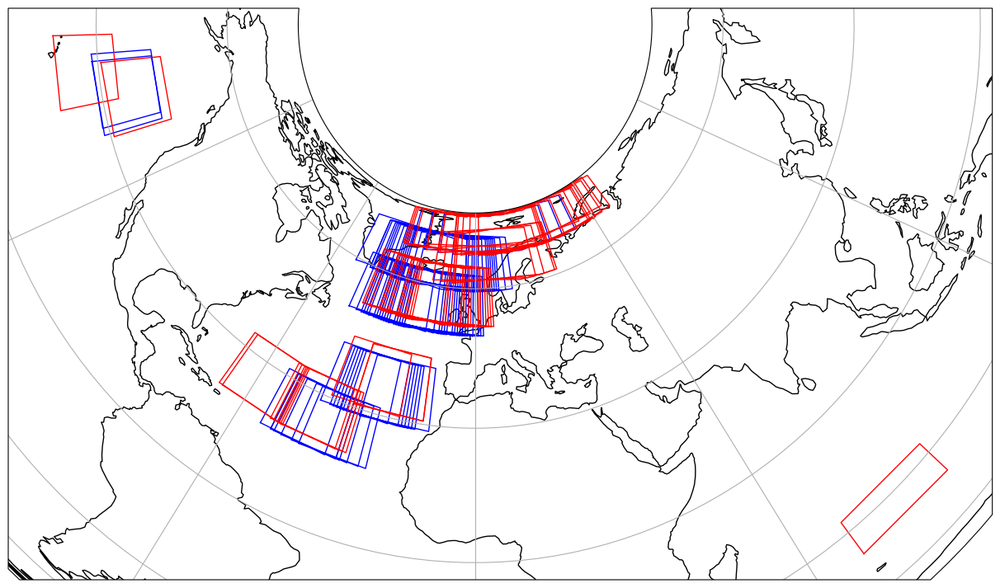

In [158]:
plot_rectangles_on_projection(inference_df, projection=ccrs.AlbersEqualArea())

In [159]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.AzimuthalEquidistant())

In [160]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.LambertConformal())

In [161]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.LambertCylindrical())

In [162]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.LambertAzimuthalEqualArea())

In [163]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.Mercator())

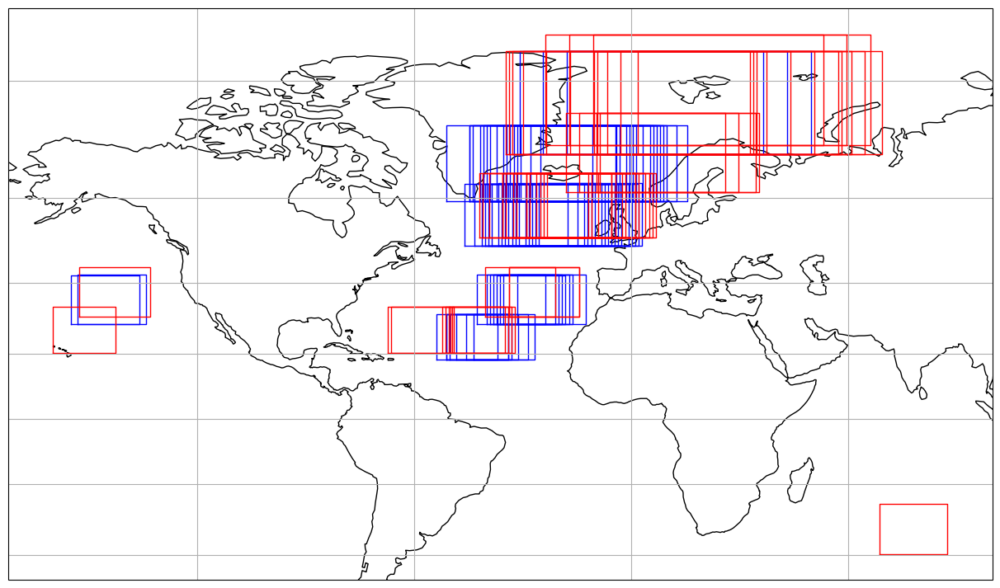

In [164]:
plot_rectangles_on_projection(inference_df, projection=ccrs.Miller())

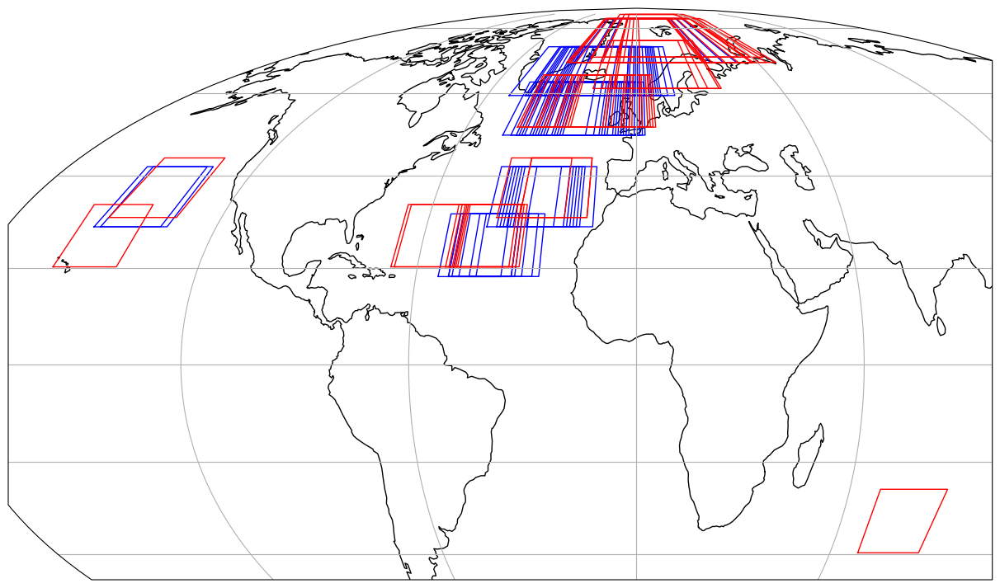

In [165]:
plot_rectangles_on_projection(inference_df, projection=ccrs.Mollweide())

In [166]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.Orthographic())

In [167]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.Sinusoidal())

In [168]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.Stereographic())

In [169]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.TransverseMercator())

In [170]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.InterruptedGoodeHomolosine())

In [171]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.NearsidePerspective())